# Load libraries

In [1]:
import tensorflow as tf
from tensorflow import keras
import tensorflow.keras.backend as K
import tensorflow_addons as tfa
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dropout, Input, Conv3D, Conv3DTranspose, BatchNormalization, Concatenate, Activation, MaxPool3D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.initializers import TruncatedNormal
from matplotlib import pyplot as plt
from IPython.display import clear_output
import numpy as np

# Load data

In [19]:
def deserialize_unpack_and_augment(serialized_example,
                                   shape,
                                   aug_shape,
                                   n_classes):
    
    def normalize(image):
        low = -1000
        high = 400
        image = tf.clip_by_value(image, clip_value_min=low, clip_value_max=high)
        image = (image - low) / (high - low)
        image = tf.cast(image, tf.float32)
        return image
    
    def cropfunc(x, y, aug_shape, shape):

        top_left_k = tf.cast((aug_shape[0] - shape[0]) / 2, tf.int32)
        top_left_j = tf.cast((aug_shape[1] - shape[1]) / 2, tf.int32)
        top_left_i = tf.cast((aug_shape[2] - shape[2]) / 2, tf.int32)

        def _crop(arr):
            return arr[top_left_k:top_left_k + shape[0],
                       top_left_j:top_left_j + shape[1],
                       top_left_i:top_left_i + shape[2]]

        return _crop(x), _crop(y)
    
    features = {"x": tf.io.FixedLenFeature([], tf.string),
                "y": tf.io.FixedLenFeature([], tf.string),
                "id": tf.io.FixedLenFeature([], tf.string)}

    parsed = tf.io.parse_single_example(serialized_example, features)
    d, h, w = aug_shape

    x = parsed["x"]
    y = parsed["y"]
    pid = parsed["id"]

    n_input_channels = 1
    x_shape = (d, h, w, n_input_channels)
    y_shape = (d, h, w, n_classes + 1)

    x = tf.io.decode_raw(x, tf.float32)
    x = normalize(x)
    x = tf.reshape(x, x_shape)

    y = tf.io.decode_raw(y, tf.int32)
    y = tf.cast(y, tf.int32)
    y = tf.reshape(y, (d, h, w, 1))

    y = tf.one_hot(y, depth=n_classes + 1)
    y = tf.reshape(y, y_shape)

    x, y = tf.cond(tf.reduce_all(tf.equal(aug_shape, shape)),
                   lambda: (x, y), lambda: cropfunc(x, y, aug_shape, shape))

    x.set_shape(shape + [n_input_channels])
    y.set_shape(shape + [n_classes + 1])
    
    return x, y#, pid

def preprocess_trainingset(serialized):
        return deserialize_unpack_and_augment(serialized_example = serialized,
                                              shape=[174, 138, 166],
                                              aug_shape = [182, 148, 176],
                                              n_classes=6)

training_dataset = tf.data.TFRecordDataset(["C:/Users/ivaben/Desktop/FDD3424 Project/All data/training.tfrecord"])
training_dataset = training_dataset.map(preprocess_trainingset)
training_dataset = training_dataset.batch(batch_size = 1)
#training_dataset = training_dataset.take(1)

# find class weights:
iterator = iter(training_dataset)

class_freq = np.zeros(7,)
for i in range(1, 58):
    image, mask = iterator.get_next()
    array = mask.numpy()
    class_freq += np.sum(array, axis = (0,1,2,3))
class_freq = class_freq/np.sum(class_freq)
print(class_freq)

weights = (1/7)/class_freq
print(weights)

#print(iterator.get_next())
#for image, mask in training_dataset.take(1):
    

validation_dataset = tf.data.TFRecordDataset(["C:/Users/ivaben/Desktop/FDD3424 Project/All data/validation.tfrecord"])
validation_dataset = validation_dataset.map(preprocess_trainingset)
validation_dataset = validation_dataset.batch(batch_size = 1)

[9.18706582e-01 1.22848549e-02 4.95530083e-03 6.53019330e-04
 8.75671866e-04 3.40857763e-02 2.84387944e-02]
[1.55498116e-01 1.16287204e+01 2.88291564e+01 2.18764034e+02
 1.63140040e+02 4.19110721e+00 5.02331923e+00]
1
2
3
4
5
6
7
8


# Define model

In [3]:
def build_unet(shape, training, keep_prob, batch_norm = True):
    inputs = Input(shape)
    flow = inputs
    
    pool_stride = 2
    pool_size = 2
    
    def crop(layer, shape):
        s1 = layer.get_shape().as_list()[1:]
        s2 = shape.as_list()[1:]
        dynamic_batch_size = tf.shape(layer)[0]
        offsets = [0, (s1[0] - s2[0]) // 2, (s1[1] - s2[1]) // 2, (s1[2] - s2[2]) // 2, 0]
        result = tf.slice(layer, offsets, [dynamic_batch_size, *s2])
        return result
    
    def conv_bn_relu(inputs, filters, kernel_size, strides, training_ = training, batch_norm_ = batch_norm):
        x = Conv3D(filters = filters, kernel_size = kernel_size, strides = strides, padding = "same", activation = None,
                   use_bias = True)(inputs)

        if batch_norm_:
            x = BatchNormalization()(x)

        x = Activation("relu")(x)

        return x
    
    ### Encoder
    n_filters = 24
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = l1 = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = MaxPool3D(pool_size = pool_size, strides = pool_stride, padding = "same")(flow)
    
    n_filters = 48
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = l2 = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = MaxPool3D(pool_size = pool_size, strides = pool_stride, padding = "same")(flow)
    
    n_filters = 96
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = l3 = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = MaxPool3D(pool_size = pool_size, strides = pool_stride, padding = "same")(flow)
    
    ### Bridge
    n_filters = 192
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = Dropout(rate = 1 - keep_prob)(flow)
    
    ### Decoder
    n_filters = 96
    flow = Conv3DTranspose(filters = n_filters, kernel_size = 3, strides = 2, padding = "same", activation = None,
                           use_bias = True, kernel_initializer = TruncatedNormal(stddev=0.1))(flow)
    
    if flow.get_shape().as_list() != l3.get_shape().as_list():
        flow = crop(flow, l3.get_shape())
        
    flow = Concatenate(axis = 4)([flow, l3])
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    
    n_filters = 48
    flow = Conv3DTranspose(filters = n_filters, kernel_size = 3, strides = 2, padding = "same", activation = None,
                           use_bias = True, kernel_initializer = TruncatedNormal(stddev=0.1))(flow)
    
    if flow.get_shape().as_list() != l2.get_shape().as_list():
        flow = crop(flow, l2.get_shape())
    
    flow = Concatenate(axis = 4)([flow, l2])
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    
    n_filters = 24
    flow = Conv3DTranspose(filters = n_filters, kernel_size = 3, strides = 2, padding = "same", activation = None,
                           use_bias = True, kernel_initializer = TruncatedNormal(stddev=0.1))(flow)
    
    if flow.get_shape().as_list() != l1.get_shape().as_list():
        flow = crop(flow, l1.get_shape())
    
    flow = Concatenate(axis = 4)([flow, l1])
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    flow = conv_bn_relu(flow, filters = n_filters, kernel_size = 3, strides = 1)
    
    logits = Conv3D(filters = 7, kernel_size = 1, strides = 1, padding = "same", activation = None, use_bias = True)(flow)
    logits = tf.identity(logits, "logits")
    
    probabilities = tf.nn.softmax(logits, name="probabilities")
    
    #predictions = tf.argmax(probabilities, axis=4)
    #predictions = tf.one_hot(predictions, depth=7)
    #ground_truths = tf.argmax(y, axis=4, name="ground_truth")
    
    return Model(inputs, probabilities)
    

# Losses and metrics

In [4]:
def weighted_categorical_crossentropy(weights):
    """
    A weighted version of keras.objectives.categorical_crossentropy
    
    Variables:
        weights: numpy array of shape (C,) where C is the number of classes
    
    Usage:
        weights = np.array([0.5,2,10]) # Class one at 0.5, class 2 twice the normal weights, class 3 10x.
        loss = weighted_categorical_crossentropy(weights)
        model.compile(loss=loss,optimizer='adam')
    """
    
    weights = K.variable(weights)
        
    def loss(y_true, y_pred):
        # scale predictions so that the class probas of each sample sum to 1
        y_pred /= K.sum(y_pred, axis=-1, keepdims=True)
        # clip to prevent NaN's and Inf's
        y_pred = K.clip(y_pred, K.epsilon(), 1 - K.epsilon())
        # calc
        loss = y_true * K.log(y_pred) * weights
        loss = -K.sum(loss, -1)
        return loss
    
    return loss

def prob_to_pred(y_prob):
    return tf.where(
        tf.equal(tf.math.reduce_max(y_prob, axis=4, keepdims=True), y_prob),
        tf.constant(1, dtype=tf.float32),
        tf.constant(0, dtype=tf.float32)
    )

def mean_dice(y_true, y_prob):
    result = 0
    for label in range(0, 7):
        result += label_dice(y_true, y_prob, label)
    return result/7

def dice0(y_true, y_prob, label = 0):
    return label_dice(y_true, y_prob, label)

def dice1(y_true, y_prob, label = 1):
    return label_dice(y_true, y_prob, label)

def dice2(y_true, y_prob, label = 2):
    return label_dice(y_true, y_prob, label)

def dice3(y_true, y_prob, label = 3):
    return label_dice(y_true, y_prob, label)

def dice4(y_true, y_prob, label = 4):
    return label_dice(y_true, y_prob, label)

def dice5(y_true, y_prob, label = 5):
    return label_dice(y_true, y_prob, label)

def dice6(y_true, y_prob, label = 6):
    return label_dice(y_true, y_prob, label)

def label_dice(y_true, y_prob, label):
    y_true = y_true[:,:,:,:,label]
    y_pred = prob_to_pred(y_prob)
    y_pred = y_pred[:,:,:,:,label]
    
    intersection = K.sum(y_true * y_pred, axis=[1,2,3]) # d, w, h?
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    #dice = K.mean((2. * intersection)/union, axis=0)
    return 2*intersection/union

In [5]:
model = build_unet(shape = (174, 138, 166, 1), training = True, keep_prob = 0.9, batch_norm = True)
model.summary(line_length = 150)

Model: "model"
______________________________________________________________________________________________________________________________________________________
Layer (type)                                     Output Shape                     Param #           Connected to                                      
input_1 (InputLayer)                             [(None, 174, 138, 166, 1)]       0                                                                   
______________________________________________________________________________________________________________________________________________________
conv3d (Conv3D)                                  (None, 174, 138, 166, 24)        672               input_1[0][0]                                     
______________________________________________________________________________________________________________________________________________________
batch_normalization (BatchNormalization)         (None, 174, 138, 166, 24)     

In [6]:
#loss = 'categorical_crossentropy'

loss = weighted_categorical_crossentropy(weights)

model.compile(optimizer = Adam(learning_rate = 0.001), loss = loss, metrics = ['accuracy', mean_dice, dice0, dice1, dice2, dice3, dice4, dice5, dice6])

# Callbacks

In [14]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logMondayNight")

checkpoint_filepath = 'cpMondayNight'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_mean_dice',
    mode='max',
    save_best_only=True)


In [8]:
#generator = tf.keras.utils.Sequence()

history = model.fit(x = training_dataset, validation_data = validation_dataset, callbacks = [tensorboard_callback, model_checkpoint_callback], epochs = 500, verbose = 2)

Epoch 1/500
57/57 - 135s - loss: 1.0656 - accuracy: 0.4134 - mean_dice: 0.1673 - dice0: 0.5579 - dice1: 0.0730 - dice2: 0.0166 - dice3: 0.0155 - dice4: 0.0257 - dice5: 0.1982 - dice6: 0.2838 - val_loss: 13.6637 - val_accuracy: 0.0010 - val_mean_dice: 0.0038 - val_dice0: 3.4327e-06 - val_dice1: 0.0000e+00 - val_dice2: 1.2060e-04 - val_dice3: 0.0241 - val_dice4: 0.0018 - val_dice5: 2.3512e-04 - val_dice6: 1.5419e-04
Epoch 2/500
57/57 - 115s - loss: 0.7024 - accuracy: 0.5736 - mean_dice: 0.2859 - dice0: 0.7237 - dice1: 0.2542 - dice2: 0.0268 - dice3: 0.0363 - dice4: 0.0457 - dice5: 0.4082 - dice6: 0.5067 - val_loss: 14.5980 - val_accuracy: 0.0127 - val_mean_dice: 0.0040 - val_dice0: 0.0013 - val_dice1: 0.0270 - val_dice2: 0.0000e+00 - val_dice3: 0.0000e+00 - val_dice4: 0.0000e+00 - val_dice5: 0.0000e+00 - val_dice6: 0.0000e+00
Epoch 3/500
57/57 - 116s - loss: 0.4524 - accuracy: 0.6437 - mean_dice: 0.3648 - dice0: 0.7672 - dice1: 0.3317 - dice2: 0.0409 - dice3: 0.0531 - dice4: 0.0499 - dic

Epoch 22/500
57/57 - 116s - loss: 0.0505 - accuracy: 0.9560 - mean_dice: 0.6426 - dice0: 0.9757 - dice1: 0.7892 - dice2: 0.3319 - dice3: 0.2055 - dice4: 0.3817 - dice5: 0.9147 - dice6: 0.8997 - val_loss: 0.2143 - val_accuracy: 0.9633 - val_mean_dice: 0.7074 - val_dice0: 0.9798 - val_dice1: 0.7488 - val_dice2: 0.3711 - val_dice3: 0.2709 - val_dice4: 0.6814 - val_dice5: 0.9503 - val_dice6: 0.9495
Epoch 23/500
57/57 - 116s - loss: 0.0489 - accuracy: 0.9564 - mean_dice: 0.6412 - dice0: 0.9759 - dice1: 0.7931 - dice2: 0.3382 - dice3: 0.1955 - dice4: 0.3685 - dice5: 0.9143 - dice6: 0.9026 - val_loss: 0.4284 - val_accuracy: 0.9595 - val_mean_dice: 0.6904 - val_dice0: 0.9778 - val_dice1: 0.8109 - val_dice2: 0.3317 - val_dice3: 0.1678 - val_dice4: 0.6522 - val_dice5: 0.9511 - val_dice6: 0.9414
Epoch 24/500
57/57 - 317s - loss: 0.0562 - accuracy: 0.9539 - mean_dice: 0.6371 - dice0: 0.9746 - dice1: 0.7810 - dice2: 0.3251 - dice3: 0.2078 - dice4: 0.3805 - dice5: 0.9012 - dice6: 0.8898 - val_loss: 

Epoch 43/500
57/57 - 116s - loss: 0.0316 - accuracy: 0.9690 - mean_dice: 0.6897 - dice0: 0.9830 - dice1: 0.8380 - dice2: 0.4402 - dice3: 0.2780 - dice4: 0.4436 - dice5: 0.9305 - dice6: 0.9146 - val_loss: 0.2822 - val_accuracy: 0.9782 - val_mean_dice: 0.7153 - val_dice0: 0.9881 - val_dice1: 0.8500 - val_dice2: 0.5734 - val_dice3: 0.2918 - val_dice4: 0.3883 - val_dice5: 0.9632 - val_dice6: 0.9523
Epoch 44/500
57/57 - 117s - loss: 0.0315 - accuracy: 0.9681 - mean_dice: 0.6890 - dice0: 0.9825 - dice1: 0.8396 - dice2: 0.4234 - dice3: 0.2844 - dice4: 0.4494 - dice5: 0.9297 - dice6: 0.9138 - val_loss: 0.2955 - val_accuracy: 0.9573 - val_mean_dice: 0.7093 - val_dice0: 0.9760 - val_dice1: 0.8308 - val_dice2: 0.2862 - val_dice3: 0.3447 - val_dice4: 0.5994 - val_dice5: 0.9664 - val_dice6: 0.9612
Epoch 45/500
57/57 - 117s - loss: 0.0301 - accuracy: 0.9705 - mean_dice: 0.7062 - dice0: 0.9838 - dice1: 0.8412 - dice2: 0.4392 - dice3: 0.3069 - dice4: 0.5203 - dice5: 0.9327 - dice6: 0.9196 - val_loss: 

Epoch 64/500
57/57 - 114s - loss: 0.0273 - accuracy: 0.9746 - mean_dice: 0.7242 - dice0: 0.9861 - dice1: 0.8487 - dice2: 0.5135 - dice3: 0.3021 - dice4: 0.5579 - dice5: 0.9367 - dice6: 0.9245 - val_loss: 0.3793 - val_accuracy: 0.9690 - val_mean_dice: 0.7236 - val_dice0: 0.9829 - val_dice1: 0.8179 - val_dice2: 0.4107 - val_dice3: 0.1644 - val_dice4: 0.7606 - val_dice5: 0.9680 - val_dice6: 0.9607
Epoch 65/500
57/57 - 114s - loss: 0.0257 - accuracy: 0.9747 - mean_dice: 0.7244 - dice0: 0.9861 - dice1: 0.8314 - dice2: 0.5274 - dice3: 0.3077 - dice4: 0.5572 - dice5: 0.9371 - dice6: 0.9239 - val_loss: 0.2400 - val_accuracy: 0.9743 - val_mean_dice: 0.7537 - val_dice0: 0.9858 - val_dice1: 0.8145 - val_dice2: 0.4778 - val_dice3: 0.3994 - val_dice4: 0.6881 - val_dice5: 0.9526 - val_dice6: 0.9573
Epoch 66/500
57/57 - 114s - loss: 0.0242 - accuracy: 0.9759 - mean_dice: 0.7320 - dice0: 0.9868 - dice1: 0.8471 - dice2: 0.5368 - dice3: 0.3343 - dice4: 0.5551 - dice5: 0.9385 - dice6: 0.9256 - val_loss: 

Epoch 85/500
57/57 - 116s - loss: 0.1968 - accuracy: 0.8533 - mean_dice: 0.4559 - dice0: 0.9149 - dice1: 0.4327 - dice2: 0.1729 - dice3: 0.0910 - dice4: 0.0776 - dice5: 0.7668 - dice6: 0.7351 - val_loss: 10.8405 - val_accuracy: 0.0362 - val_mean_dice: 0.0339 - val_dice0: 0.0318 - val_dice1: 0.0000e+00 - val_dice2: 0.0000e+00 - val_dice3: 0.0036 - val_dice4: 0.0071 - val_dice5: 0.1142 - val_dice6: 0.0808
Epoch 86/500
57/57 - 117s - loss: 0.0961 - accuracy: 0.9188 - mean_dice: 0.5489 - dice0: 0.9544 - dice1: 0.6675 - dice2: 0.2160 - dice3: 0.1256 - dice4: 0.1343 - dice5: 0.8794 - dice6: 0.8648 - val_loss: 3.1940 - val_accuracy: 0.5310 - val_mean_dice: 0.2261 - val_dice0: 0.6716 - val_dice1: 0.1528 - val_dice2: 0.0753 - val_dice3: 0.0116 - val_dice4: 0.0324 - val_dice5: 0.3661 - val_dice6: 0.2727
Epoch 87/500
57/57 - 116s - loss: 0.0654 - accuracy: 0.9394 - mean_dice: 0.5890 - dice0: 0.9662 - dice1: 0.7452 - dice2: 0.2756 - dice3: 0.1643 - dice4: 0.2105 - dice5: 0.8924 - dice6: 0.8689 - v

Epoch 106/500
57/57 - 115s - loss: 0.0227 - accuracy: 0.9765 - mean_dice: 0.7305 - dice0: 0.9871 - dice1: 0.8597 - dice2: 0.5693 - dice3: 0.3448 - dice4: 0.4996 - dice5: 0.9337 - dice6: 0.9194 - val_loss: 0.3512 - val_accuracy: 0.9829 - val_mean_dice: 0.7873 - val_dice0: 0.9907 - val_dice1: 0.8595 - val_dice2: 0.6438 - val_dice3: 0.3311 - val_dice4: 0.7770 - val_dice5: 0.9650 - val_dice6: 0.9439
Epoch 107/500
57/57 - 116s - loss: 0.0210 - accuracy: 0.9770 - mean_dice: 0.7356 - dice0: 0.9874 - dice1: 0.8645 - dice2: 0.5730 - dice3: 0.3545 - dice4: 0.5158 - dice5: 0.9344 - dice6: 0.9197 - val_loss: 0.3167 - val_accuracy: 0.9841 - val_mean_dice: 0.7988 - val_dice0: 0.9913 - val_dice1: 0.8664 - val_dice2: 0.6618 - val_dice3: 0.3813 - val_dice4: 0.7743 - val_dice5: 0.9657 - val_dice6: 0.9508
Epoch 108/500
57/57 - 115s - loss: 0.0205 - accuracy: 0.9775 - mean_dice: 0.7371 - dice0: 0.9876 - dice1: 0.8658 - dice2: 0.5937 - dice3: 0.3351 - dice4: 0.5218 - dice5: 0.9356 - dice6: 0.9204 - val_los

Epoch 127/500
57/57 - 114s - loss: 0.0401 - accuracy: 0.9625 - mean_dice: 0.6859 - dice0: 0.9793 - dice1: 0.8314 - dice2: 0.4257 - dice3: 0.2676 - dice4: 0.4648 - dice5: 0.9224 - dice6: 0.9100 - val_loss: 0.8075 - val_accuracy: 0.6497 - val_mean_dice: 0.5170 - val_dice0: 0.7614 - val_dice1: 0.7366 - val_dice2: 0.0421 - val_dice3: 0.2516 - val_dice4: 0.0654 - val_dice5: 0.9312 - val_dice6: 0.8308
Epoch 128/500
57/57 - 114s - loss: 0.1431 - accuracy: 0.8949 - mean_dice: 0.5418 - dice0: 0.9395 - dice1: 0.6085 - dice2: 0.1869 - dice3: 0.1498 - dice4: 0.1803 - dice5: 0.8854 - dice6: 0.8423 - val_loss: 7.2859 - val_accuracy: 0.3987 - val_mean_dice: 0.1512 - val_dice0: 0.5487 - val_dice1: 0.1580 - val_dice2: 0.0294 - val_dice3: 0.0092 - val_dice4: 0.0187 - val_dice5: 0.1685 - val_dice6: 0.1262
Epoch 129/500
57/57 - 114s - loss: 0.1267 - accuracy: 0.9111 - mean_dice: 0.5345 - dice0: 0.9502 - dice1: 0.6504 - dice2: 0.2263 - dice3: 0.1060 - dice4: 0.1513 - dice5: 0.8419 - dice6: 0.8155 - val_los

Epoch 148/500
57/57 - 114s - loss: 0.0184 - accuracy: 0.9796 - mean_dice: 0.7540 - dice0: 0.9888 - dice1: 0.8750 - dice2: 0.6098 - dice3: 0.3823 - dice4: 0.5525 - dice5: 0.9412 - dice6: 0.9284 - val_loss: 0.3144 - val_accuracy: 0.9820 - val_mean_dice: 0.7717 - val_dice0: 0.9902 - val_dice1: 0.8520 - val_dice2: 0.6346 - val_dice3: 0.3137 - val_dice4: 0.6988 - val_dice5: 0.9655 - val_dice6: 0.9470
Epoch 149/500
57/57 - 114s - loss: 0.0181 - accuracy: 0.9807 - mean_dice: 0.7606 - dice0: 0.9894 - dice1: 0.8760 - dice2: 0.6400 - dice3: 0.3832 - dice4: 0.5625 - dice5: 0.9424 - dice6: 0.9303 - val_loss: 0.4998 - val_accuracy: 0.9846 - val_mean_dice: 0.7837 - val_dice0: 0.9916 - val_dice1: 0.8761 - val_dice2: 0.6469 - val_dice3: 0.3495 - val_dice4: 0.7187 - val_dice5: 0.9631 - val_dice6: 0.9399
Epoch 150/500
57/57 - 114s - loss: 0.0190 - accuracy: 0.9805 - mean_dice: 0.7575 - dice0: 0.9893 - dice1: 0.8730 - dice2: 0.6416 - dice3: 0.3812 - dice4: 0.5444 - dice5: 0.9434 - dice6: 0.9297 - val_los

Epoch 169/500
57/57 - 114s - loss: 0.0222 - accuracy: 0.9763 - mean_dice: 0.7315 - dice0: 0.9870 - dice1: 0.8501 - dice2: 0.5395 - dice3: 0.3466 - dice4: 0.5324 - dice5: 0.9433 - dice6: 0.9220 - val_loss: 0.3453 - val_accuracy: 0.9836 - val_mean_dice: 0.7893 - val_dice0: 0.9910 - val_dice1: 0.8444 - val_dice2: 0.6798 - val_dice3: 0.3673 - val_dice4: 0.7263 - val_dice5: 0.9631 - val_dice6: 0.9529
Epoch 170/500
57/57 - 114s - loss: 0.0181 - accuracy: 0.9797 - mean_dice: 0.7536 - dice0: 0.9889 - dice1: 0.8704 - dice2: 0.6017 - dice3: 0.3771 - dice4: 0.5627 - dice5: 0.9461 - dice6: 0.9283 - val_loss: 0.4480 - val_accuracy: 0.9848 - val_mean_dice: 0.7837 - val_dice0: 0.9917 - val_dice1: 0.8517 - val_dice2: 0.6555 - val_dice3: 0.3562 - val_dice4: 0.7084 - val_dice5: 0.9685 - val_dice6: 0.9541
Epoch 171/500
57/57 - 114s - loss: 0.0168 - accuracy: 0.9809 - mean_dice: 0.7634 - dice0: 0.9895 - dice1: 0.8749 - dice2: 0.6254 - dice3: 0.4032 - dice4: 0.5719 - dice5: 0.9465 - dice6: 0.9321 - val_los

Epoch 190/500
57/57 - 114s - loss: 0.0165 - accuracy: 0.9810 - mean_dice: 0.7605 - dice0: 0.9896 - dice1: 0.8846 - dice2: 0.6547 - dice3: 0.3936 - dice4: 0.5329 - dice5: 0.9420 - dice6: 0.9263 - val_loss: 0.4019 - val_accuracy: 0.9851 - val_mean_dice: 0.7776 - val_dice0: 0.9919 - val_dice1: 0.8796 - val_dice2: 0.6636 - val_dice3: 0.3526 - val_dice4: 0.6291 - val_dice5: 0.9697 - val_dice6: 0.9566
Epoch 191/500
57/57 - 114s - loss: 0.0157 - accuracy: 0.9819 - mean_dice: 0.7678 - dice0: 0.9901 - dice1: 0.8854 - dice2: 0.6731 - dice3: 0.4026 - dice4: 0.5493 - dice5: 0.9433 - dice6: 0.9309 - val_loss: 0.4715 - val_accuracy: 0.9853 - val_mean_dice: 0.7984 - val_dice0: 0.9920 - val_dice1: 0.8724 - val_dice2: 0.6685 - val_dice3: 0.4064 - val_dice4: 0.7223 - val_dice5: 0.9682 - val_dice6: 0.9592
Epoch 192/500
57/57 - 114s - loss: 0.0152 - accuracy: 0.9826 - mean_dice: 0.7759 - dice0: 0.9905 - dice1: 0.8844 - dice2: 0.6866 - dice3: 0.4315 - dice4: 0.5603 - dice5: 0.9447 - dice6: 0.9335 - val_los

Epoch 211/500
57/57 - 114s - loss: 0.0383 - accuracy: 0.9614 - mean_dice: 0.6582 - dice0: 0.9787 - dice1: 0.8114 - dice2: 0.3928 - dice3: 0.2166 - dice4: 0.3912 - dice5: 0.9173 - dice6: 0.8994 - val_loss: 2.2941 - val_accuracy: 0.9102 - val_mean_dice: 0.5150 - val_dice0: 0.9513 - val_dice1: 0.5327 - val_dice2: 0.2849 - val_dice3: 0.2379 - val_dice4: 0.0386 - val_dice5: 0.7733 - val_dice6: 0.7862
Epoch 212/500
57/57 - 114s - loss: 0.0268 - accuracy: 0.9711 - mean_dice: 0.7008 - dice0: 0.9841 - dice1: 0.8514 - dice2: 0.4727 - dice3: 0.2817 - dice4: 0.4744 - dice5: 0.9316 - dice6: 0.9099 - val_loss: 0.2033 - val_accuracy: 0.9647 - val_mean_dice: 0.6913 - val_dice0: 0.9804 - val_dice1: 0.7897 - val_dice2: 0.4351 - val_dice3: 0.2771 - val_dice4: 0.5326 - val_dice5: 0.9356 - val_dice6: 0.8886
Epoch 213/500
57/57 - 114s - loss: 0.0208 - accuracy: 0.9760 - mean_dice: 0.7290 - dice0: 0.9868 - dice1: 0.8630 - dice2: 0.5457 - dice3: 0.3363 - dice4: 0.5172 - dice5: 0.9363 - dice6: 0.9180 - val_los

Epoch 232/500
57/57 - 114s - loss: 0.0123 - accuracy: 0.9856 - mean_dice: 0.8022 - dice0: 0.9921 - dice1: 0.9043 - dice2: 0.7341 - dice3: 0.4799 - dice4: 0.6083 - dice5: 0.9530 - dice6: 0.9435 - val_loss: 0.4992 - val_accuracy: 0.9852 - val_mean_dice: 0.8002 - val_dice0: 0.9919 - val_dice1: 0.8846 - val_dice2: 0.6635 - val_dice3: 0.4181 - val_dice4: 0.7210 - val_dice5: 0.9697 - val_dice6: 0.9529
Epoch 233/500
57/57 - 114s - loss: 0.0124 - accuracy: 0.9855 - mean_dice: 0.8023 - dice0: 0.9921 - dice1: 0.9004 - dice2: 0.7365 - dice3: 0.4768 - dice4: 0.6133 - dice5: 0.9536 - dice6: 0.9435 - val_loss: 0.5029 - val_accuracy: 0.9847 - val_mean_dice: 0.8039 - val_dice0: 0.9916 - val_dice1: 0.8812 - val_dice2: 0.6409 - val_dice3: 0.4454 - val_dice4: 0.7438 - val_dice5: 0.9722 - val_dice6: 0.9524
Epoch 234/500
57/57 - 114s - loss: 0.0130 - accuracy: 0.9852 - mean_dice: 0.7987 - dice0: 0.9919 - dice1: 0.8991 - dice2: 0.7199 - dice3: 0.4706 - dice4: 0.6119 - dice5: 0.9534 - dice6: 0.9439 - val_los

Epoch 253/500
57/57 - 114s - loss: 0.0135 - accuracy: 0.9853 - mean_dice: 0.7973 - dice0: 0.9919 - dice1: 0.8847 - dice2: 0.7457 - dice3: 0.4386 - dice4: 0.6169 - dice5: 0.9559 - dice6: 0.9471 - val_loss: 0.4393 - val_accuracy: 0.9826 - val_mean_dice: 0.7864 - val_dice0: 0.9904 - val_dice1: 0.8787 - val_dice2: 0.6340 - val_dice3: 0.4790 - val_dice4: 0.6092 - val_dice5: 0.9611 - val_dice6: 0.9521
Epoch 254/500
57/57 - 114s - loss: 0.0123 - accuracy: 0.9857 - mean_dice: 0.8023 - dice0: 0.9922 - dice1: 0.8900 - dice2: 0.7489 - dice3: 0.4652 - dice4: 0.6176 - dice5: 0.9562 - dice6: 0.9458 - val_loss: 0.5877 - val_accuracy: 0.9842 - val_mean_dice: 0.7882 - val_dice0: 0.9914 - val_dice1: 0.8667 - val_dice2: 0.6350 - val_dice3: 0.4226 - val_dice4: 0.6911 - val_dice5: 0.9570 - val_dice6: 0.9533
Epoch 255/500
57/57 - 114s - loss: 0.0120 - accuracy: 0.9861 - mean_dice: 0.8076 - dice0: 0.9924 - dice1: 0.8963 - dice2: 0.7485 - dice3: 0.4828 - dice4: 0.6300 - dice5: 0.9565 - dice6: 0.9469 - val_los

Epoch 274/500
57/57 - 114s - loss: 0.0103 - accuracy: 0.9876 - mean_dice: 0.8231 - dice0: 0.9932 - dice1: 0.9105 - dice2: 0.7733 - dice3: 0.5337 - dice4: 0.6408 - dice5: 0.9592 - dice6: 0.9510 - val_loss: 0.6212 - val_accuracy: 0.9833 - val_mean_dice: 0.8059 - val_dice0: 0.9909 - val_dice1: 0.8584 - val_dice2: 0.5801 - val_dice3: 0.4769 - val_dice4: 0.7993 - val_dice5: 0.9721 - val_dice6: 0.9636
Epoch 275/500
57/57 - 114s - loss: 0.0105 - accuracy: 0.9874 - mean_dice: 0.8198 - dice0: 0.9931 - dice1: 0.9105 - dice2: 0.7682 - dice3: 0.5264 - dice4: 0.6316 - dice5: 0.9589 - dice6: 0.9501 - val_loss: 0.4534 - val_accuracy: 0.9855 - val_mean_dice: 0.8143 - val_dice0: 0.9921 - val_dice1: 0.8758 - val_dice2: 0.6639 - val_dice3: 0.4744 - val_dice4: 0.7662 - val_dice5: 0.9683 - val_dice6: 0.9596
Epoch 276/500
57/57 - 114s - loss: 0.0110 - accuracy: 0.9870 - mean_dice: 0.8134 - dice0: 0.9929 - dice1: 0.9078 - dice2: 0.7602 - dice3: 0.5208 - dice4: 0.6036 - dice5: 0.9587 - dice6: 0.9502 - val_los

Epoch 295/500
57/57 - 114s - loss: 0.0108 - accuracy: 0.9865 - mean_dice: 0.8152 - dice0: 0.9926 - dice1: 0.9125 - dice2: 0.7477 - dice3: 0.5253 - dice4: 0.6300 - dice5: 0.9536 - dice6: 0.9450 - val_loss: 0.5721 - val_accuracy: 0.9867 - val_mean_dice: 0.8150 - val_dice0: 0.9927 - val_dice1: 0.8947 - val_dice2: 0.6657 - val_dice3: 0.4831 - val_dice4: 0.7412 - val_dice5: 0.9708 - val_dice6: 0.9570
Epoch 296/500
57/57 - 114s - loss: 0.0108 - accuracy: 0.9866 - mean_dice: 0.8154 - dice0: 0.9927 - dice1: 0.9129 - dice2: 0.7485 - dice3: 0.5240 - dice4: 0.6302 - dice5: 0.9541 - dice6: 0.9454 - val_loss: 0.6087 - val_accuracy: 0.9872 - val_mean_dice: 0.8221 - val_dice0: 0.9930 - val_dice1: 0.8973 - val_dice2: 0.6878 - val_dice3: 0.4961 - val_dice4: 0.7542 - val_dice5: 0.9701 - val_dice6: 0.9561
Epoch 297/500
57/57 - 114s - loss: 0.0105 - accuracy: 0.9869 - mean_dice: 0.8189 - dice0: 0.9928 - dice1: 0.9148 - dice2: 0.7558 - dice3: 0.5308 - dice4: 0.6371 - dice5: 0.9549 - dice6: 0.9463 - val_los

Epoch 316/500
57/57 - 114s - loss: 0.0092 - accuracy: 0.9883 - mean_dice: 0.8327 - dice0: 0.9936 - dice1: 0.9173 - dice2: 0.7925 - dice3: 0.5571 - dice4: 0.6557 - dice5: 0.9602 - dice6: 0.9524 - val_loss: 0.5998 - val_accuracy: 0.9863 - val_mean_dice: 0.8238 - val_dice0: 0.9925 - val_dice1: 0.8804 - val_dice2: 0.6678 - val_dice3: 0.5163 - val_dice4: 0.7804 - val_dice5: 0.9700 - val_dice6: 0.9593
Epoch 317/500
57/57 - 114s - loss: 0.0094 - accuracy: 0.9886 - mean_dice: 0.8343 - dice0: 0.9938 - dice1: 0.9229 - dice2: 0.7989 - dice3: 0.5526 - dice4: 0.6587 - dice5: 0.9604 - dice6: 0.9531 - val_loss: 0.7348 - val_accuracy: 0.9870 - val_mean_dice: 0.8279 - val_dice0: 0.9929 - val_dice1: 0.8996 - val_dice2: 0.6807 - val_dice3: 0.4972 - val_dice4: 0.7967 - val_dice5: 0.9695 - val_dice6: 0.9589
Epoch 318/500
57/57 - 114s - loss: 0.0096 - accuracy: 0.9884 - mean_dice: 0.8298 - dice0: 0.9936 - dice1: 0.9203 - dice2: 0.7912 - dice3: 0.5365 - dice4: 0.6532 - dice5: 0.9606 - dice6: 0.9529 - val_los

Epoch 337/500
57/57 - 114s - loss: 0.0090 - accuracy: 0.9888 - mean_dice: 0.8342 - dice0: 0.9938 - dice1: 0.9210 - dice2: 0.7945 - dice3: 0.5565 - dice4: 0.6561 - dice5: 0.9624 - dice6: 0.9548 - val_loss: 0.6080 - val_accuracy: 0.9868 - val_mean_dice: 0.8287 - val_dice0: 0.9928 - val_dice1: 0.8983 - val_dice2: 0.6805 - val_dice3: 0.5227 - val_dice4: 0.7835 - val_dice5: 0.9702 - val_dice6: 0.9530
Epoch 338/500
57/57 - 114s - loss: 0.0091 - accuracy: 0.9887 - mean_dice: 0.8334 - dice0: 0.9938 - dice1: 0.9205 - dice2: 0.8004 - dice3: 0.5528 - dice4: 0.6494 - dice5: 0.9624 - dice6: 0.9543 - val_loss: 0.6676 - val_accuracy: 0.9868 - val_mean_dice: 0.8198 - val_dice0: 0.9928 - val_dice1: 0.8881 - val_dice2: 0.6703 - val_dice3: 0.5339 - val_dice4: 0.7213 - val_dice5: 0.9746 - val_dice6: 0.9577
Epoch 339/500
57/57 - 114s - loss: 0.0088 - accuracy: 0.9889 - mean_dice: 0.8388 - dice0: 0.9939 - dice1: 0.9204 - dice2: 0.8057 - dice3: 0.5739 - dice4: 0.6613 - dice5: 0.9617 - dice6: 0.9548 - val_los

Epoch 358/500
57/57 - 114s - loss: 0.0089 - accuracy: 0.9888 - mean_dice: 0.8353 - dice0: 0.9939 - dice1: 0.9191 - dice2: 0.8083 - dice3: 0.5658 - dice4: 0.6443 - dice5: 0.9614 - dice6: 0.9544 - val_loss: 0.6429 - val_accuracy: 0.9870 - val_mean_dice: 0.8337 - val_dice0: 0.9929 - val_dice1: 0.8907 - val_dice2: 0.6883 - val_dice3: 0.5375 - val_dice4: 0.8051 - val_dice5: 0.9661 - val_dice6: 0.9553
Epoch 359/500
57/57 - 114s - loss: 0.0084 - accuracy: 0.9891 - mean_dice: 0.8418 - dice0: 0.9941 - dice1: 0.9238 - dice2: 0.8106 - dice3: 0.5884 - dice4: 0.6586 - dice5: 0.9618 - dice6: 0.9556 - val_loss: 0.6905 - val_accuracy: 0.9876 - val_mean_dice: 0.8352 - val_dice0: 0.9932 - val_dice1: 0.9053 - val_dice2: 0.6822 - val_dice3: 0.5523 - val_dice4: 0.7862 - val_dice5: 0.9706 - val_dice6: 0.9568
Epoch 360/500
57/57 - 114s - loss: 0.0082 - accuracy: 0.9895 - mean_dice: 0.8456 - dice0: 0.9942 - dice1: 0.9293 - dice2: 0.8162 - dice3: 0.5970 - dice4: 0.6645 - dice5: 0.9625 - dice6: 0.9556 - val_los

Epoch 379/500
57/57 - 114s - loss: 0.0086 - accuracy: 0.9894 - mean_dice: 0.8434 - dice0: 0.9942 - dice1: 0.9255 - dice2: 0.7986 - dice3: 0.5794 - dice4: 0.6850 - dice5: 0.9643 - dice6: 0.9566 - val_loss: 0.6484 - val_accuracy: 0.9864 - val_mean_dice: 0.8182 - val_dice0: 0.9925 - val_dice1: 0.8987 - val_dice2: 0.6586 - val_dice3: 0.4957 - val_dice4: 0.7518 - val_dice5: 0.9686 - val_dice6: 0.9615
Epoch 380/500
57/57 - 114s - loss: 0.0082 - accuracy: 0.9896 - mean_dice: 0.8451 - dice0: 0.9943 - dice1: 0.9266 - dice2: 0.8074 - dice3: 0.5766 - dice4: 0.6887 - dice5: 0.9644 - dice6: 0.9575 - val_loss: 0.7223 - val_accuracy: 0.9856 - val_mean_dice: 0.8055 - val_dice0: 0.9922 - val_dice1: 0.8663 - val_dice2: 0.6265 - val_dice3: 0.5210 - val_dice4: 0.7010 - val_dice5: 0.9713 - val_dice6: 0.9606
Epoch 381/500
57/57 - 114s - loss: 0.0083 - accuracy: 0.9895 - mean_dice: 0.8442 - dice0: 0.9942 - dice1: 0.9222 - dice2: 0.8077 - dice3: 0.5816 - dice4: 0.6812 - dice5: 0.9645 - dice6: 0.9581 - val_los

Epoch 400/500
57/57 - 114s - loss: 0.0085 - accuracy: 0.9893 - mean_dice: 0.8383 - dice0: 0.9942 - dice1: 0.9304 - dice2: 0.8052 - dice3: 0.5806 - dice4: 0.6384 - dice5: 0.9639 - dice6: 0.9555 - val_loss: 0.6546 - val_accuracy: 0.9832 - val_mean_dice: 0.8026 - val_dice0: 0.9907 - val_dice1: 0.9040 - val_dice2: 0.5465 - val_dice3: 0.5325 - val_dice4: 0.7078 - val_dice5: 0.9741 - val_dice6: 0.9624
Epoch 401/500
57/57 - 114s - loss: 0.0079 - accuracy: 0.9899 - mean_dice: 0.8461 - dice0: 0.9945 - dice1: 0.9331 - dice2: 0.8197 - dice3: 0.5865 - dice4: 0.6657 - dice5: 0.9648 - dice6: 0.9585 - val_loss: 0.6165 - val_accuracy: 0.9879 - val_mean_dice: 0.8221 - val_dice0: 0.9934 - val_dice1: 0.9084 - val_dice2: 0.6932 - val_dice3: 0.4870 - val_dice4: 0.7390 - val_dice5: 0.9721 - val_dice6: 0.9619
Epoch 402/500
57/57 - 114s - loss: 0.0076 - accuracy: 0.9901 - mean_dice: 0.8485 - dice0: 0.9946 - dice1: 0.9355 - dice2: 0.8252 - dice3: 0.5929 - dice4: 0.6669 - dice5: 0.9653 - dice6: 0.9591 - val_los

Epoch 421/500
57/57 - 114s - loss: 0.0072 - accuracy: 0.9909 - mean_dice: 0.8620 - dice0: 0.9950 - dice1: 0.9396 - dice2: 0.8305 - dice3: 0.6291 - dice4: 0.7102 - dice5: 0.9674 - dice6: 0.9622 - val_loss: 0.7109 - val_accuracy: 0.9878 - val_mean_dice: 0.8166 - val_dice0: 0.9934 - val_dice1: 0.8877 - val_dice2: 0.6800 - val_dice3: 0.5217 - val_dice4: 0.6963 - val_dice5: 0.9733 - val_dice6: 0.9638
Epoch 422/500
57/57 - 114s - loss: 0.0079 - accuracy: 0.9903 - mean_dice: 0.8518 - dice0: 0.9947 - dice1: 0.9339 - dice2: 0.8163 - dice3: 0.6043 - dice4: 0.6865 - dice5: 0.9671 - dice6: 0.9600 - val_loss: 0.4913 - val_accuracy: 0.9871 - val_mean_dice: 0.8173 - val_dice0: 0.9930 - val_dice1: 0.8921 - val_dice2: 0.6560 - val_dice3: 0.5192 - val_dice4: 0.7214 - val_dice5: 0.9721 - val_dice6: 0.9675
Epoch 423/500
57/57 - 114s - loss: 0.0082 - accuracy: 0.9899 - mean_dice: 0.8462 - dice0: 0.9945 - dice1: 0.9277 - dice2: 0.8109 - dice3: 0.6039 - dice4: 0.6600 - dice5: 0.9672 - dice6: 0.9596 - val_los

Epoch 442/500
57/57 - 114s - loss: 0.0078 - accuracy: 0.9897 - mean_dice: 0.8496 - dice0: 0.9944 - dice1: 0.9313 - dice2: 0.8218 - dice3: 0.5993 - dice4: 0.6834 - dice5: 0.9626 - dice6: 0.9546 - val_loss: 0.7526 - val_accuracy: 0.9882 - val_mean_dice: 0.8312 - val_dice0: 0.9936 - val_dice1: 0.9029 - val_dice2: 0.7042 - val_dice3: 0.5250 - val_dice4: 0.7650 - val_dice5: 0.9695 - val_dice6: 0.9586
Epoch 443/500
57/57 - 114s - loss: 0.0077 - accuracy: 0.9899 - mean_dice: 0.8512 - dice0: 0.9945 - dice1: 0.9343 - dice2: 0.8239 - dice3: 0.6020 - dice4: 0.6858 - dice5: 0.9631 - dice6: 0.9551 - val_loss: 0.7284 - val_accuracy: 0.9880 - val_mean_dice: 0.8280 - val_dice0: 0.9935 - val_dice1: 0.9016 - val_dice2: 0.6956 - val_dice3: 0.5234 - val_dice4: 0.7533 - val_dice5: 0.9694 - val_dice6: 0.9593
Epoch 444/500
57/57 - 114s - loss: 0.0076 - accuracy: 0.9900 - mean_dice: 0.8523 - dice0: 0.9945 - dice1: 0.9352 - dice2: 0.8250 - dice3: 0.6038 - dice4: 0.6888 - dice5: 0.9634 - dice6: 0.9557 - val_los

Epoch 463/500
57/57 - 114s - loss: 0.0066 - accuracy: 0.9913 - mean_dice: 0.8686 - dice0: 0.9952 - dice1: 0.9423 - dice2: 0.8462 - dice3: 0.6487 - dice4: 0.7187 - dice5: 0.9677 - dice6: 0.9614 - val_loss: 0.8171 - val_accuracy: 0.9877 - val_mean_dice: 0.8243 - val_dice0: 0.9933 - val_dice1: 0.8908 - val_dice2: 0.6727 - val_dice3: 0.5369 - val_dice4: 0.7406 - val_dice5: 0.9738 - val_dice6: 0.9620
Epoch 464/500
57/57 - 114s - loss: 0.0066 - accuracy: 0.9912 - mean_dice: 0.8688 - dice0: 0.9952 - dice1: 0.9416 - dice2: 0.8456 - dice3: 0.6518 - dice4: 0.7179 - dice5: 0.9678 - dice6: 0.9615 - val_loss: 0.7732 - val_accuracy: 0.9874 - val_mean_dice: 0.8306 - val_dice0: 0.9931 - val_dice1: 0.8966 - val_dice2: 0.6678 - val_dice3: 0.5537 - val_dice4: 0.7713 - val_dice5: 0.9718 - val_dice6: 0.9602
Epoch 465/500
57/57 - 114s - loss: 0.0066 - accuracy: 0.9913 - mean_dice: 0.8684 - dice0: 0.9953 - dice1: 0.9430 - dice2: 0.8445 - dice3: 0.6419 - dice4: 0.7238 - dice5: 0.9680 - dice6: 0.9619 - val_los

Epoch 484/500
57/57 - 114s - loss: 0.0060 - accuracy: 0.9919 - mean_dice: 0.8778 - dice0: 0.9956 - dice1: 0.9450 - dice2: 0.8602 - dice3: 0.6747 - dice4: 0.7353 - dice5: 0.9698 - dice6: 0.9639 - val_loss: 0.9869 - val_accuracy: 0.9894 - val_mean_dice: 0.8394 - val_dice0: 0.9942 - val_dice1: 0.9121 - val_dice2: 0.7127 - val_dice3: 0.5677 - val_dice4: 0.7549 - val_dice5: 0.9711 - val_dice6: 0.9629
Epoch 485/500
57/57 - 114s - loss: 0.0061 - accuracy: 0.9920 - mean_dice: 0.8775 - dice0: 0.9956 - dice1: 0.9453 - dice2: 0.8606 - dice3: 0.6769 - dice4: 0.7300 - dice5: 0.9698 - dice6: 0.9641 - val_loss: 0.8518 - val_accuracy: 0.9883 - val_mean_dice: 0.8306 - val_dice0: 0.9936 - val_dice1: 0.9016 - val_dice2: 0.6906 - val_dice3: 0.5483 - val_dice4: 0.7467 - val_dice5: 0.9733 - val_dice6: 0.9599
Epoch 486/500
57/57 - 114s - loss: 0.0063 - accuracy: 0.9918 - mean_dice: 0.8740 - dice0: 0.9955 - dice1: 0.9449 - dice2: 0.8583 - dice3: 0.6498 - dice4: 0.7362 - dice5: 0.9694 - dice6: 0.9637 - val_los

# Inference

In [20]:
# class order: 0: background, 1: 

#print(history.history)
model.load_weights('cpTuesdayNight/cpTuesdayNight')
model.evaluate(validation_dataset)

#ynew = model.predict(training_dataset)
#print(ynew)

8/8 [==============================] - 4s 494ms/step - loss: 0.9869 - accuracy: 0.9894 - mean_dice: 0.8394 - dice0: 0.9942 - dice1: 0.9121 - dice2: 0.7127 - dice3: 0.5677 - dice4: 0.7549 - dice5: 0.9711 - dice6: 0.9629


[0.9868550300598145,
 0.989379346370697,
 0.8393597602844238,
 0.9941987991333008,
 0.9120696187019348,
 0.7126690745353699,
 0.5677298903465271,
 0.7548534274101257,
 0.9710894823074341,
 0.9629080295562744]

# Plots

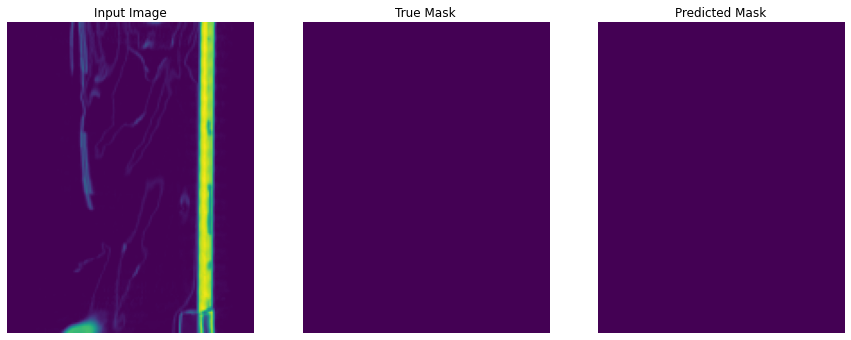

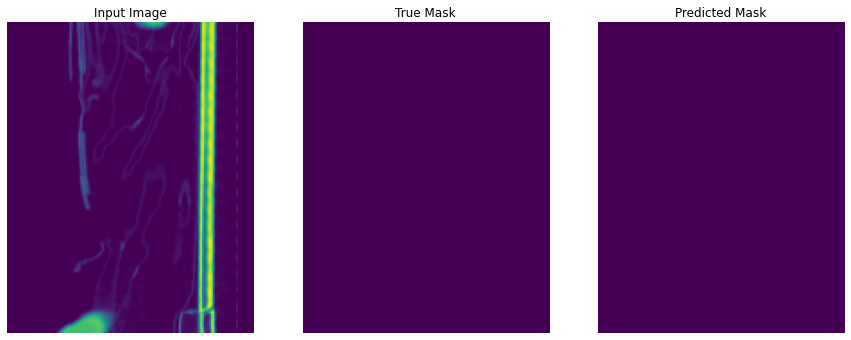

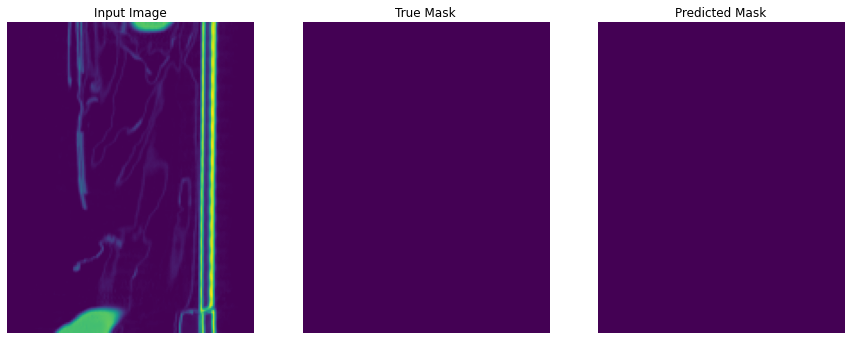

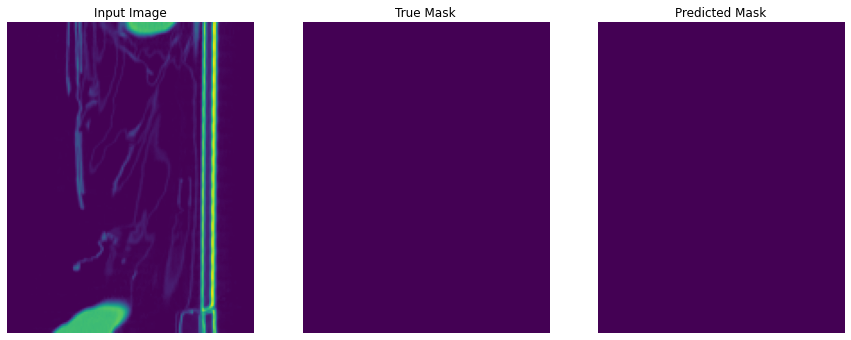

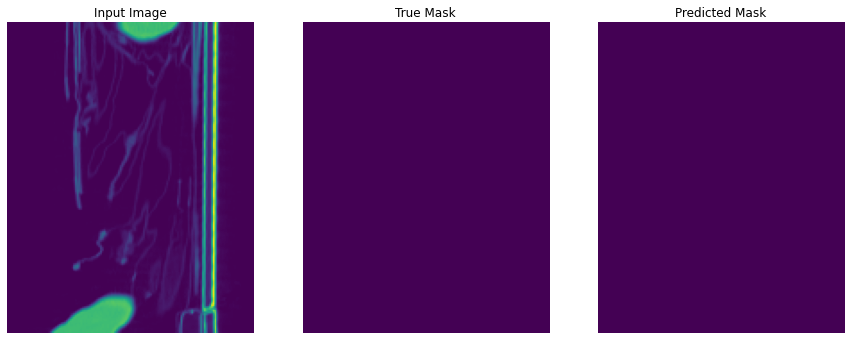

...

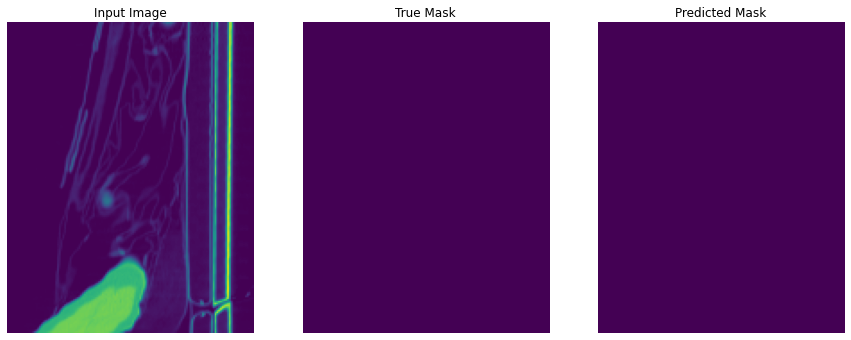

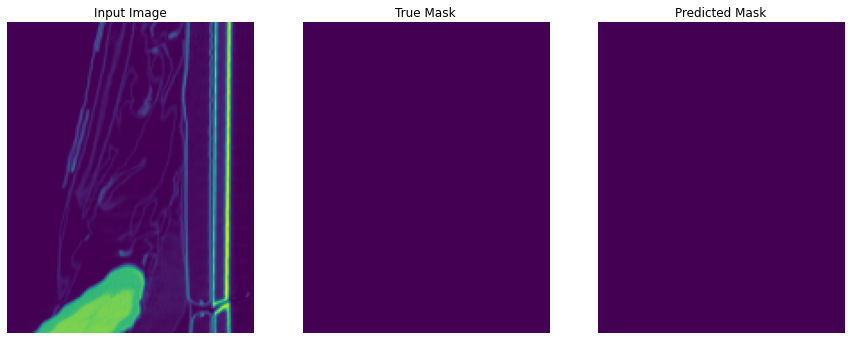

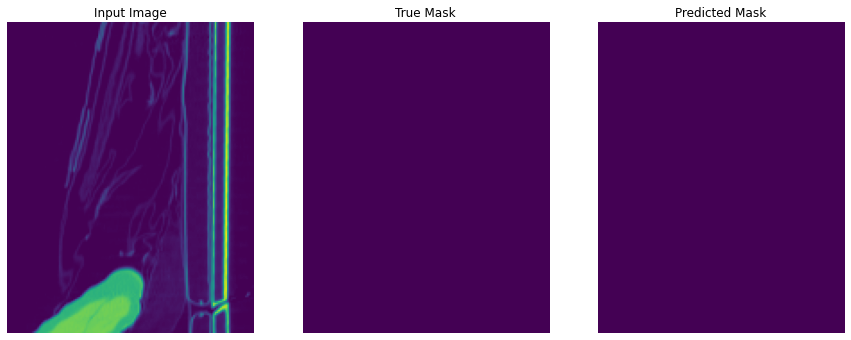

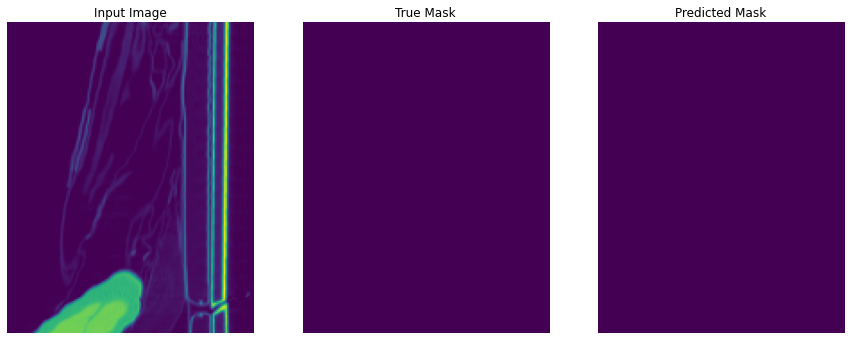

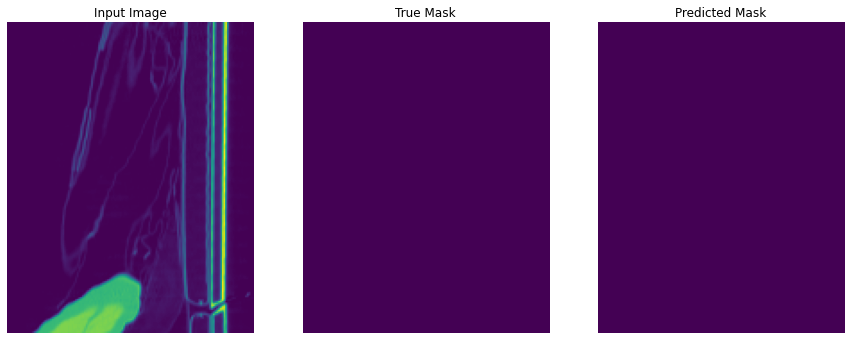

In [10]:
def display(display_list, slice_idx = 110):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])

        if display_list[i].shape[4] > 1:
            array = tf.math.argmax(display_list[i], axis = 4)
            array = tf.expand_dims(array, axis = -1)
        else:
            array = display_list[i]
        
        array = array[0, :, :, slice_idx:slice_idx+1, 0]
        
        plt.imshow(tf.keras.preprocessing.image.array_to_img(array))
        plt.axis('off')
    
    plt.show()
    plt.close()

for image, mask in validation_dataset.take(1):
    pred = prob_to_pred(model.predict(image))
    
    for slice_idx in range(0, 166):
        display([image, mask, pred], slice_idx)